## Import necessary library

In [1]:
import os 
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
#pip install tensorflow 

In [3]:
# FFOR UNZZIPPING 7Z FILE ##
#import py7zr 
 
#with py7zr.SevenZipFile('train.7z', mode='r') as z: 
#    z.extractall() 

## EDA

In [4]:
## sample audio 
samples, sample_rate = librosa.load('TESS_Toronto_emotional_speech_set_data/OAF_happy/OAF_back_happy.wav')


In [5]:
ipd.Audio('TESS_Toronto_emotional_speech_set_data/OAF_happy/OAF_back_happy.wav')

In [6]:
samples

array([ 0.00011396, -0.00136029, -0.00253447, ...,  0.00282335,
        0.00142893,  0.        ], dtype=float32)

In [7]:
sample_rate

22050

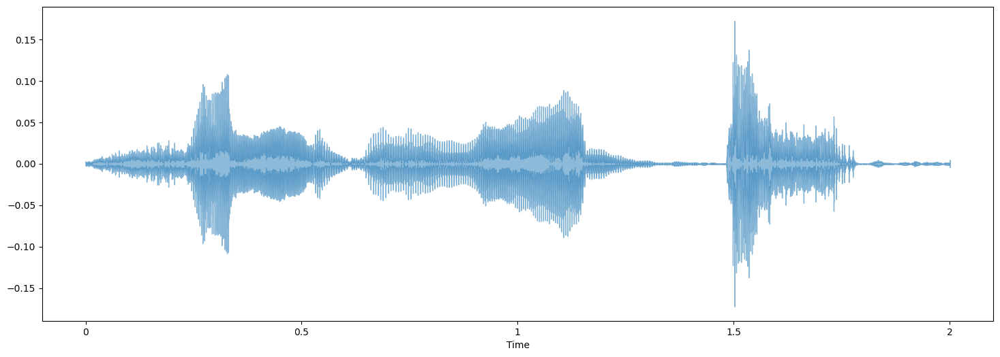

In [8]:

plt.figure(figsize=(18,6))
librosa.display.waveshow(samples, sr=sample_rate, alpha=0.5)
plt.show()

## Mel-frequency cepstral coefficients (MFCCs) 

Mel-frequency cepstral coefficients (MFCCs) : are coefficients that collectively make up an MFC They are derived from a type of cepstral representation of the audio clip (a nonlinear "spectrum-of-a-spectrum"). The difference between the cepstrum and the mel-frequency cepstrum is that in the MFC, the frequency bands are equally spaced on the mel scale, which approximates the human auditory system's response more closely than the linearly-spaced frequency bands used in the normal spectrum. This frequency warping can allow for better representation of sound, for example, in audio compression that might potentially reduce the transmission bandwidth and the storage requirements of audio signals.

MFCCs are commonly derived as follows:

    1, Take the Fourier transform of (a windowed excerpt of) a signal.
    2, Map the powers of the spectrum obtained above onto the mel scale, using triangular overlapping windows or 
       alternatively,cosine overlapping windows.
    3, Take the logs of the powers at each of the mel frequencies.
    4, Take the discrete cosine transform of the list of mel log powers, as if it were a signal.
    5, The MFCCs are the amplitudes of the resulting spectrum.

In [9]:
#Extract MFCC's

mfccs = librosa.feature.mfcc(y=samples, n_mfcc = 10, sr = sample_rate)
mfccs.shape

(10, 87)

In [10]:
mfccs

array([[-5.45441650e+02, -4.91010651e+02, -4.66325439e+02,
        -4.54346741e+02, -4.40217896e+02, -4.26069214e+02,
        -4.02125885e+02, -3.77883667e+02, -3.73146851e+02,
        -3.45660675e+02, -3.18775513e+02, -3.14597168e+02,
        -2.95899628e+02, -2.73394684e+02, -2.72021698e+02,
        -3.07515686e+02, -3.80533142e+02, -3.98982849e+02,
        -3.91842926e+02, -3.86321167e+02, -3.87818787e+02,
        -3.94710876e+02, -4.01445679e+02, -4.13723633e+02,
        -4.43483765e+02, -4.83764191e+02, -5.09195435e+02,
        -4.73142242e+02, -4.31939087e+02, -4.06059692e+02,
        -4.10781830e+02, -4.26177094e+02, -4.41147675e+02,
        -4.77400055e+02, -5.46059692e+02, -5.88835510e+02,
        -6.08037170e+02, -6.06525146e+02, -5.68794556e+02,
        -5.24336914e+02, -4.84395935e+02, -4.74432983e+02,
        -4.65147675e+02, -4.59690063e+02, -4.52890015e+02,
        -4.49224976e+02, -4.33330872e+02, -4.22919128e+02,
        -4.18801605e+02, -4.23875885e+02, -4.74476105e+0

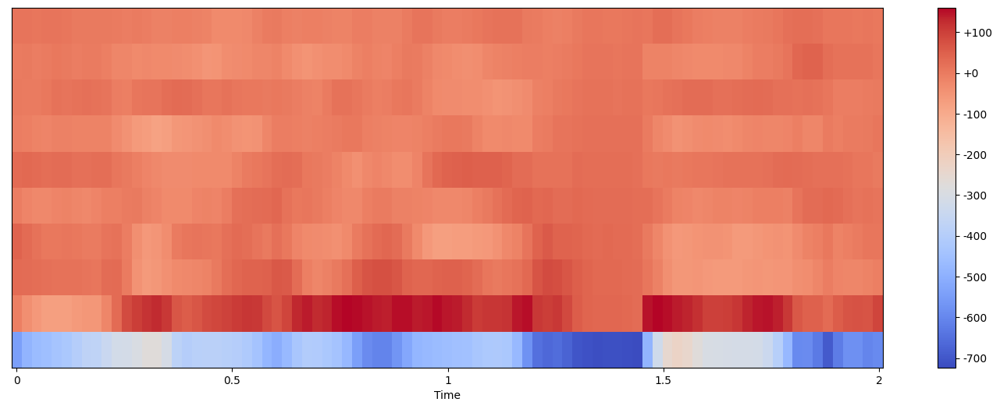

In [11]:
plt.figure(figsize=(18,6))
librosa.display.specshow(mfccs, sr=sample_rate, x_axis='time')

plt.colorbar(format='%+2.f')
plt.show()

In [12]:
delta_mfccs= librosa.feature.delta(mfccs)
delta_mfccs.shape

(10, 87)

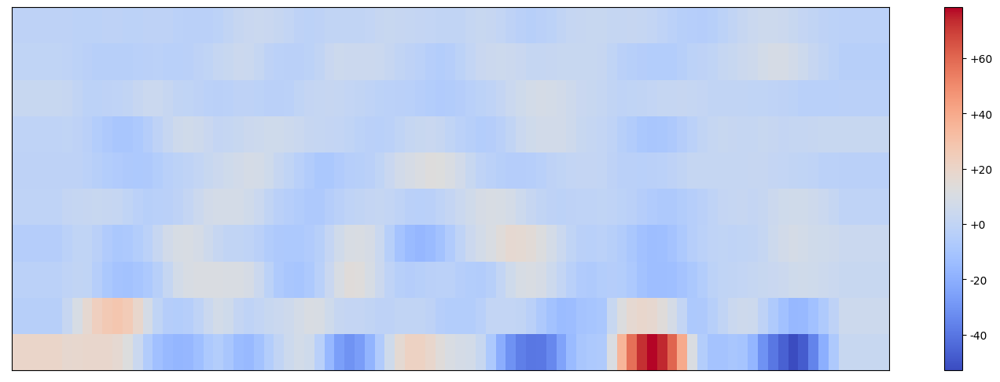

In [13]:
plt.figure(figsize=(18,6))
librosa.display.specshow(delta_mfccs, sr=sample_rate)

plt.colorbar(format='%+2.f')
plt.show()

In [14]:
double_delta_mfccs=librosa.feature.delta(mfccs, order=2)
double_delta_mfccs.shape

(10, 87)

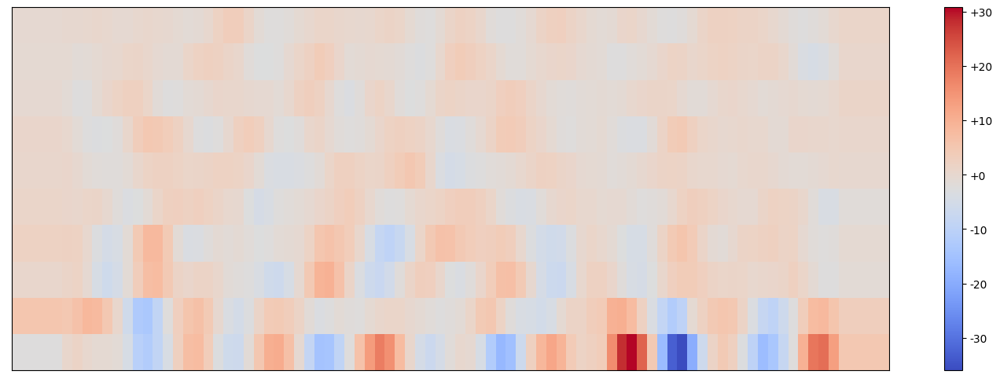

In [15]:
plt.figure(figsize=(18,6))
librosa.display.specshow(double_delta_mfccs, sr=sample_rate)

plt.colorbar(format='%+2.f')
plt.show()

In [16]:
mfcc_features= np.concatenate((mfccs,delta_mfccs,double_delta_mfccs))
mfcc_features.shape

(30, 87)

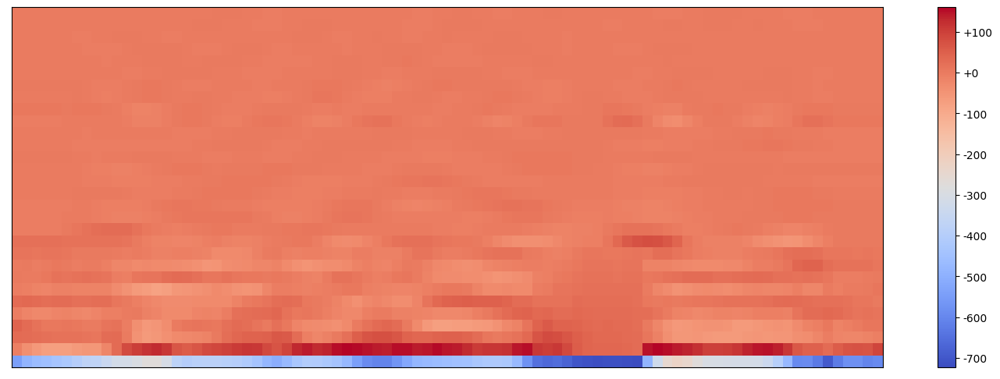

In [17]:
plt.figure(figsize=(18,6))
librosa.display.specshow(mfcc_features, sr=sample_rate)

plt.colorbar(format='%+2.f')
plt.show()

In [18]:

ipd.Audio('TESS_Toronto_emotional_speech_set_data/YAF_happy/YAF_check_happy.wav')

In [19]:
ipd.Audio('TESS_Toronto_emotional_speech_set_data/OAF_angry/OAF_bar_angry.wav')

In [20]:
samples = librosa.resample(samples, sample_rate, 8000)
ipd.Audio(samples, rate=8000)

In [21]:
labels = os.listdir('TESS_Toronto_emotional_speech_set_data/')
len(labels)

14

## Preprocessing 

In [22]:
## wave to mfcc 
def wav2mfcc(file_path, max_len=40):
    wave, sr = librosa.load(file_path)
    mfccs = librosa.feature.mfcc(wave, sr=16000)
    delta_mfccs= librosa.feature.delta(mfccs)
    double_delta_mfccs=librosa.feature.delta(mfccs, order=2)
    mfcc_features= np.concatenate((mfccs,delta_mfccs,double_delta_mfccs))
    
    # If maximum length exceeds mfcc lengths then pad the remaining ones
    if (max_len > mfcc_features.shape[1]):
        pad_width = max_len - mfcc_features.shape[1]
        mfcc_features = np.pad(mfcc_features, pad_width=((0, 0), (0, pad_width)), mode='constant')

    # Else cutoff the remaining parts
    else:
        mfcc_features = mfcc_features[:, :max_len]
    
    return mfcc_features

In [23]:
## extract waves and label from data
waves_ =[]
labels_=[]

for label in labels[:14]:
    print(label)
    waves = [f for f in os.listdir('TESS_Toronto_emotional_speech_set_data/'+label) if f.endswith('.wav')]
    for wav in waves:
#         print(wav)
#         samples, sample_rate = librosa.load('train/audio/'+label+'/'+wav)
#         signal, sr = librosa.load('train/audio/'+label+'/'+wav)
        mfccs = wav2mfcc('TESS_Toronto_emotional_speech_set_data/'+label+'/'+wav)
#         samples = librosa.resample(samples, sample_rate, 8000)
        
#         if(len(mfccs)==8000):
        waves_.append(mfccs)
        labels_.append(label)

OAF_angry
OAF_disgust
OAF_Fear
OAF_happy
OAF_neutral
OAF_Pleasant_surprise
OAF_Sad
YAF_angry
YAF_disgust
YAF_fear
YAF_happy
YAF_neutral
YAF_pleasant_surprised
YAF_sad


In [24]:
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = to_categorical(le.fit_transform(labels_))


In [25]:
print("Number of samples:",len(waves_))
print("Size of each sample(frames,mfccs) :",waves_[0].shape)

Number of samples: 2800
Size of each sample(frames,mfccs) : (60, 40)


In [26]:
len(waves_)

2800

In [27]:
waves_=np.array(waves_).reshape(-1,2400,1)

In [28]:
waves_.shape

(2800, 2400, 1)

In [29]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(waves_,np.array(y), random_state=10)

In [30]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((2100, 2400, 1), (700, 2400, 1), (2100, 14), (700, 14))

In [31]:
len(y_train)

2100

## CNN architecture

In [32]:
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, Input, MaxPooling1D
from tensorflow.keras.models import Model

In [33]:
inputs = Input(shape=(2400,1))

#First Convolution Layer
conv = Conv1D(8,13,padding='valid',activation='relu',strides=1)(inputs)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Second Layer
conv = Conv1D(16,11, padding='valid',activation='relu',strides=1)(conv)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Third Layer
conv = Conv1D(32,9, padding='valid',activation='relu',strides=1)(conv)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

#Fourth Layer
conv = Conv1D(64,7, padding='valid',activation='relu',strides=1)(conv)
conv = MaxPooling1D(3)(conv)
conv = Dropout(0.3)(conv)

conv = Flatten()(conv)

conv = Dense(256, activation='relu')(conv)
conv = Dropout(0.3)(conv)

conv = Dense(128, activation='relu')(conv)
conv = Dropout(0.3)(conv)

outputs = Dense(len(labels[:14]), activation='softmax')(conv)

model=Model(inputs,outputs)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 2400, 1)]         0         
                                                                 
 conv1d (Conv1D)             (None, 2388, 8)           112       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 796, 8)           0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 796, 8)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 786, 16)           1424      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 262, 16)          0         
 1D)                                                         

In [34]:
## model ModelCheckpoint call back
from tensorflow.keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='saved_models/Toronto_emotional.h5', 
                               monitor="val_accuracy",
                               verbose=1,
                               save_best_only=True,)

## compile the model 

In [35]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

## model fitting

In [36]:
history = model.fit(x_train,y_train,epochs=200,batch_size=30,validation_data=(x_test,y_test),callbacks=[checkpointer])

Epoch 1/200
70/70 [==============================] - ETA: 0s - loss: 3.0618 - accuracy: 0.1148
Epoch 1: val_accuracy improved from -inf to 0.22714, saving model to saved_models\Toronto_emotional.h5
70/70 [==============================] - 6s 75ms/step - loss: 3.0618 - accuracy: 0.1148 - val_loss: 2.5347 - val_accuracy: 0.2271
Epoch 2/200
70/70 [==============================] - ETA: 0s - loss: 2.3376 - accuracy: 0.2057
Epoch 2: val_accuracy improved from 0.22714 to 0.50000, saving model to saved_models\Toronto_emotional.h5
70/70 [==============================] - 5s 67ms/step - loss: 2.3376 - accuracy: 0.2057 - val_loss: 2.0574 - val_accuracy: 0.5000
Epoch 3/200
70/70 [==============================] - ETA: 0s - loss: 1.7412 - accuracy: 0.3786
Epoch 3: val_accuracy improved from 0.50000 to 0.71000, saving model to saved_models\Toronto_emotional.h5
70/70 [==============================] - 4s 61ms/step - loss: 1.7412 - accuracy: 0.3786 - val_loss: 1.1253 - val_accuracy: 0.7100
Epoch 4/20

70/70 [==============================] - 5s 67ms/step - loss: 0.1463 - accuracy: 0.9552 - val_loss: 0.0564 - val_accuracy: 0.9829
Epoch 29/200
70/70 [==============================] - ETA: 0s - loss: 0.1109 - accuracy: 0.9576
Epoch 29: val_accuracy improved from 0.98571 to 0.98857, saving model to saved_models\Toronto_emotional.h5
70/70 [==============================] - 5s 69ms/step - loss: 0.1109 - accuracy: 0.9576 - val_loss: 0.0468 - val_accuracy: 0.9886
Epoch 30/200
70/70 [==============================] - ETA: 0s - loss: 0.0938 - accuracy: 0.9671
Epoch 30: val_accuracy did not improve from 0.98857
70/70 [==============================] - 4s 61ms/step - loss: 0.0938 - accuracy: 0.9671 - val_loss: 0.0397 - val_accuracy: 0.9886
Epoch 31/200
70/70 [==============================] - ETA: 0s - loss: 0.1290 - accuracy: 0.9562
Epoch 31: val_accuracy did not improve from 0.98857
70/70 [==============================] - 5s 65ms/step - loss: 0.1290 - accuracy: 0.9562 - val_loss: 0.0485 - va

70/70 [==============================] - 5s 65ms/step - loss: 0.0608 - accuracy: 0.9810 - val_loss: 0.0329 - val_accuracy: 0.9900
Epoch 58/200
70/70 [==============================] - ETA: 0s - loss: 0.0429 - accuracy: 0.9857
Epoch 58: val_accuracy did not improve from 0.99429
70/70 [==============================] - 5s 65ms/step - loss: 0.0429 - accuracy: 0.9857 - val_loss: 0.0322 - val_accuracy: 0.9943
Epoch 59/200
70/70 [==============================] - ETA: 0s - loss: 0.0626 - accuracy: 0.9786
Epoch 59: val_accuracy did not improve from 0.99429
70/70 [==============================] - 5s 69ms/step - loss: 0.0626 - accuracy: 0.9786 - val_loss: 0.0467 - val_accuracy: 0.9886
Epoch 60/200
70/70 [==============================] - ETA: 0s - loss: 0.0525 - accuracy: 0.9871
Epoch 60: val_accuracy did not improve from 0.99429
70/70 [==============================] - 4s 57ms/step - loss: 0.0525 - accuracy: 0.9871 - val_loss: 0.0394 - val_accuracy: 0.9914
Epoch 61/200
70/70 [================

70/70 [==============================] - ETA: 0s - loss: 0.0364 - accuracy: 0.9895
Epoch 87: val_accuracy did not improve from 0.99429
70/70 [==============================] - 5s 69ms/step - loss: 0.0364 - accuracy: 0.9895 - val_loss: 0.0388 - val_accuracy: 0.9914
Epoch 88/200
70/70 [==============================] - ETA: 0s - loss: 0.0462 - accuracy: 0.9848
Epoch 88: val_accuracy did not improve from 0.99429
70/70 [==============================] - 4s 62ms/step - loss: 0.0462 - accuracy: 0.9848 - val_loss: 0.0407 - val_accuracy: 0.9914
Epoch 89/200
70/70 [==============================] - ETA: 0s - loss: 0.0752 - accuracy: 0.9781
Epoch 89: val_accuracy did not improve from 0.99429
70/70 [==============================] - 5s 65ms/step - loss: 0.0752 - accuracy: 0.9781 - val_loss: 0.0633 - val_accuracy: 0.9871
Epoch 90/200
70/70 [==============================] - ETA: 0s - loss: 0.0577 - accuracy: 0.9810
Epoch 90: val_accuracy did not improve from 0.99429
70/70 [========================

70/70 [==============================] - ETA: 0s - loss: 0.0604 - accuracy: 0.9810
Epoch 116: val_accuracy did not improve from 0.99714
70/70 [==============================] - 4s 64ms/step - loss: 0.0604 - accuracy: 0.9810 - val_loss: 0.0440 - val_accuracy: 0.9871
Epoch 117/200
70/70 [==============================] - ETA: 0s - loss: 0.0393 - accuracy: 0.9886
Epoch 117: val_accuracy did not improve from 0.99714
70/70 [==============================] - 4s 60ms/step - loss: 0.0393 - accuracy: 0.9886 - val_loss: 0.0460 - val_accuracy: 0.9914
Epoch 118/200
70/70 [==============================] - ETA: 0s - loss: 0.0487 - accuracy: 0.9876
Epoch 118: val_accuracy did not improve from 0.99714
70/70 [==============================] - 5s 68ms/step - loss: 0.0487 - accuracy: 0.9876 - val_loss: 0.0358 - val_accuracy: 0.9929
Epoch 119/200
70/70 [==============================] - ETA: 0s - loss: 0.0451 - accuracy: 0.9871
Epoch 119: val_accuracy did not improve from 0.99714
70/70 [=================

70/70 [==============================] - ETA: 0s - loss: 0.0316 - accuracy: 0.9914
Epoch 145: val_accuracy did not improve from 0.99714
70/70 [==============================] - 4s 62ms/step - loss: 0.0316 - accuracy: 0.9914 - val_loss: 0.0503 - val_accuracy: 0.9929
Epoch 146/200
70/70 [==============================] - ETA: 0s - loss: 0.0317 - accuracy: 0.9905
Epoch 146: val_accuracy did not improve from 0.99714
70/70 [==============================] - 5s 69ms/step - loss: 0.0317 - accuracy: 0.9905 - val_loss: 0.0584 - val_accuracy: 0.9886
Epoch 147/200
70/70 [==============================] - ETA: 0s - loss: 0.0371 - accuracy: 0.9871
Epoch 147: val_accuracy did not improve from 0.99714
70/70 [==============================] - 5s 66ms/step - loss: 0.0371 - accuracy: 0.9871 - val_loss: 0.0341 - val_accuracy: 0.9900
Epoch 148/200
70/70 [==============================] - ETA: 0s - loss: 0.0351 - accuracy: 0.9905
Epoch 148: val_accuracy did not improve from 0.99714
70/70 [=================

70/70 [==============================] - ETA: 0s - loss: 0.0234 - accuracy: 0.9938
Epoch 174: val_accuracy did not improve from 0.99714
70/70 [==============================] - 5s 69ms/step - loss: 0.0234 - accuracy: 0.9938 - val_loss: 0.0283 - val_accuracy: 0.9957
Epoch 175/200
70/70 [==============================] - ETA: 0s - loss: 0.0243 - accuracy: 0.9914
Epoch 175: val_accuracy did not improve from 0.99714
70/70 [==============================] - 4s 61ms/step - loss: 0.0243 - accuracy: 0.9914 - val_loss: 0.0320 - val_accuracy: 0.9943
Epoch 176/200
70/70 [==============================] - ETA: 0s - loss: 0.0193 - accuracy: 0.9948
Epoch 176: val_accuracy did not improve from 0.99714
70/70 [==============================] - 5s 65ms/step - loss: 0.0193 - accuracy: 0.9948 - val_loss: 0.0409 - val_accuracy: 0.9914
Epoch 177/200
69/70 [============================>.] - ETA: 0s - loss: 0.0182 - accuracy: 0.9947
Epoch 177: val_accuracy did not improve from 0.99714
70/70 [=================

## Plotting result

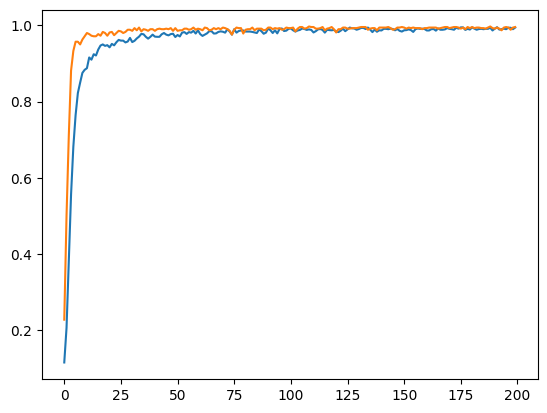

In [37]:
from matplotlib import pyplot

pyplot.plot(history.history['accuracy'], label = 'train'),
pyplot.plot(history.history['val_accuracy'], label = 'test'),
pyplot.show()

In [38]:
filepath='saved_models/Toronto_emotional.h5'
model.load_weights(filepath)

In [39]:
y_predicted= model.predict(x_test)

22/22 [==============================] - 1s 17ms/step


In [40]:
from sklearn.metrics import confusion_matrix
confusion_matrix=confusion_matrix(np.argmax(y_test, axis=1),np.argmax(y_predicted, axis=1))

## Confusion_matrix

Text(50.722222222222214, 0.5, 'Truth')

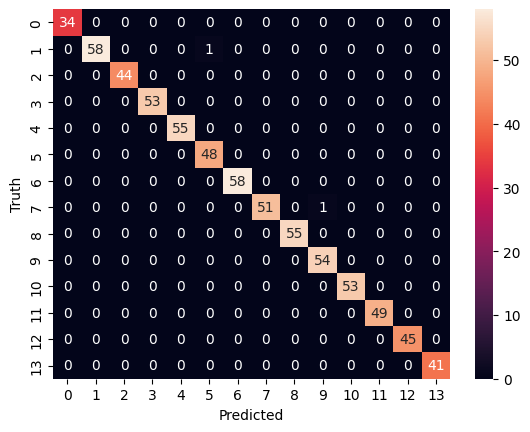

In [41]:
from matplotlib import pyplot as plt
import seaborn as sn
sn.heatmap(confusion_matrix, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

## test on different audio file

In [42]:
## function to predict audio emotion (filename)
def predict_audio(filename):
    groot, groot_sr = librosa.load(filename)

    groot_wave=wav2mfcc(filename)
    groot_wave=np.array(groot_wave).reshape(-1,2400,1)
    groot_wave.shape
    y_pred = np.argmax(model.predict(groot_wave),axis=1)
    print(y_pred)
    y_pred = le.inverse_transform(y_pred) 
    print(y_pred)

    return ipd.Audio(filename)
    

## test these model on marvel best dialogue in english 

In [44]:
predict_audio("Ant-Man Oh God.wav")

1/1 [==============================] - 0s 38ms/step
[9]
['YAF_fear']


In [45]:
predict_audio("Teenage-Groot.wav")

1/1 [==============================] - 0s 57ms/step
[4]
['OAF_disgust']


In [46]:
predict_audio("Captain America ! Dialogue Tone.wav")

1/1 [==============================] - 0s 18ms/step
[0]
['OAF_Fear']


In [47]:
predict_audio("We-Are-Groot.wav")

1/1 [==============================] - 0s 32ms/step
[0]
['OAF_Fear']


In [48]:
predict_audio("I-Am-Iron-Man.wav")

1/1 [==============================] - 0s 41ms/step
[1]
['OAF_Pleasant_surprise']


In [59]:
predict_audio('Loki-Falling.wav')

1/1 [==============================] - 0s 106ms/step
[13]
['YAF_sad']


In [60]:
predict_audio('Thor-friend.wav')

1/1 [==============================] - 0s 78ms/step
[1]
['OAF_Pleasant_surprise']
